# Build k-means classifier

## Train model (slower)

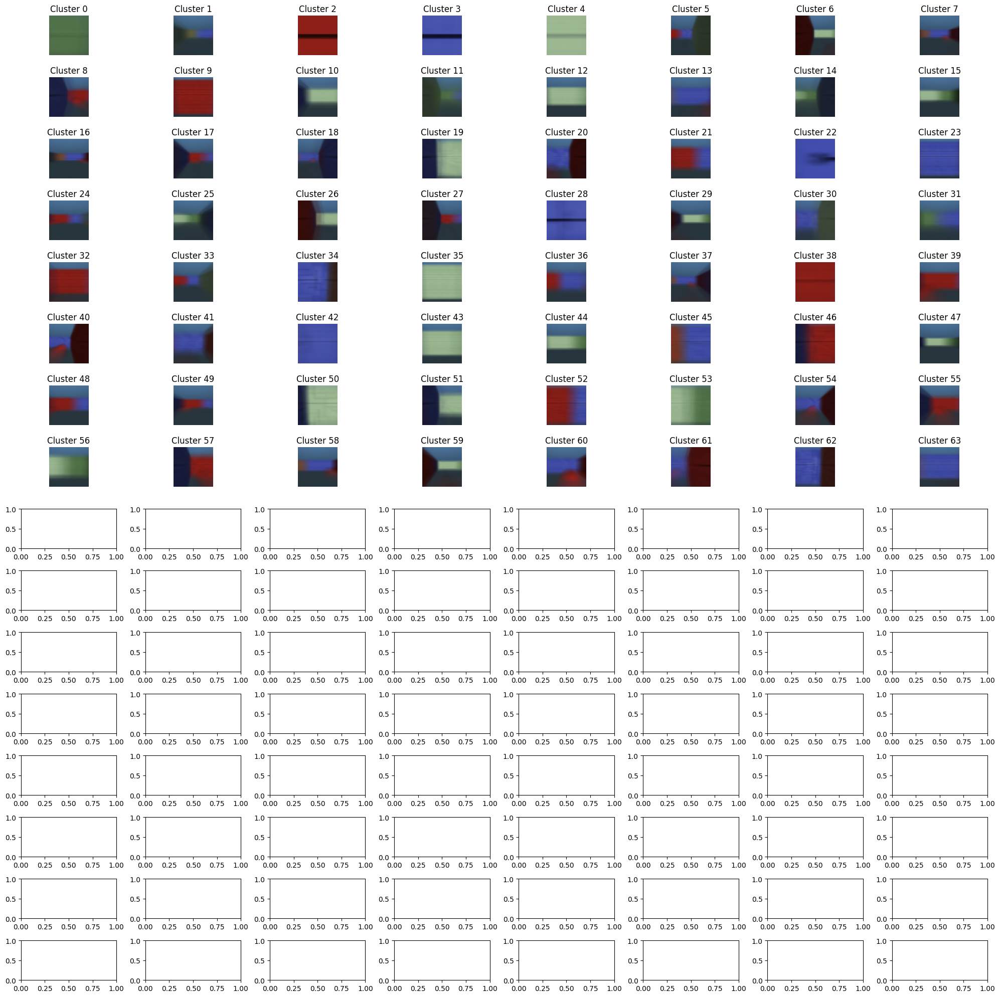

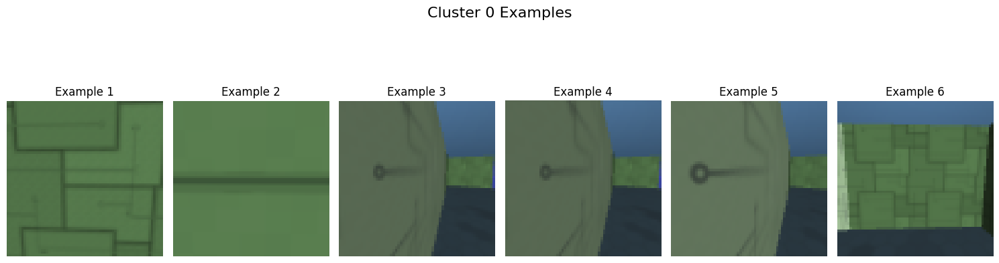

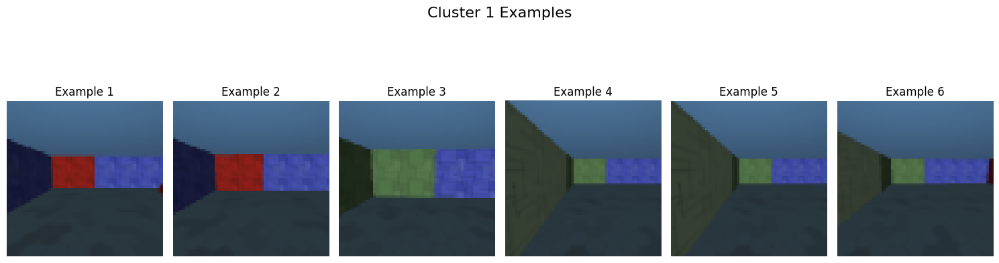

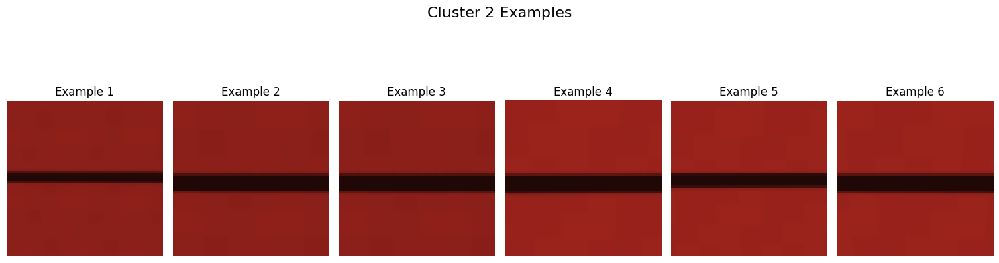

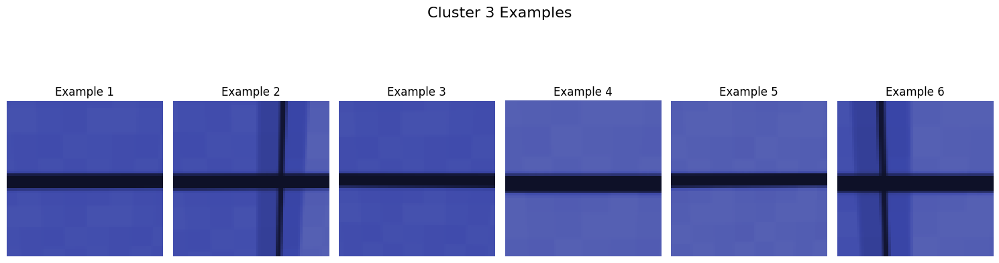

...

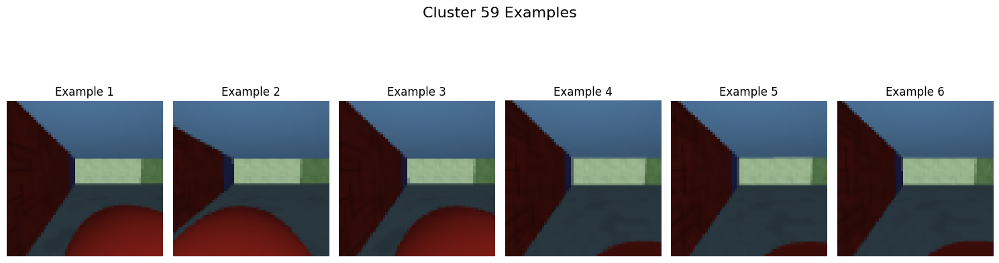

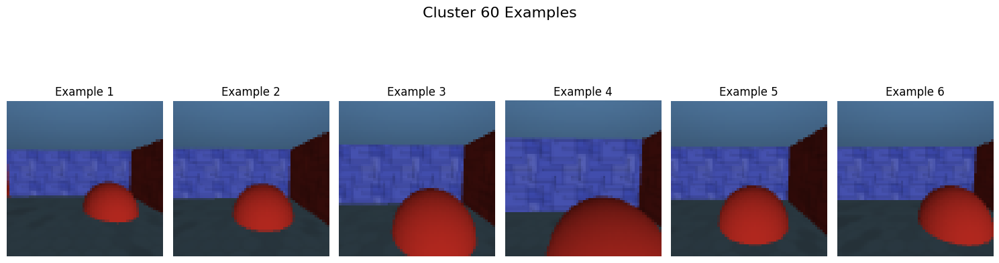

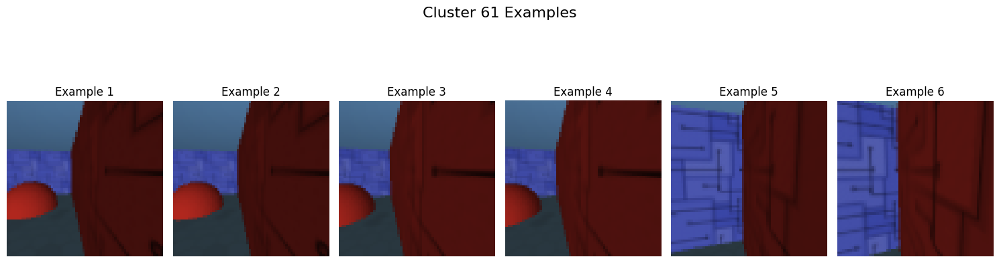

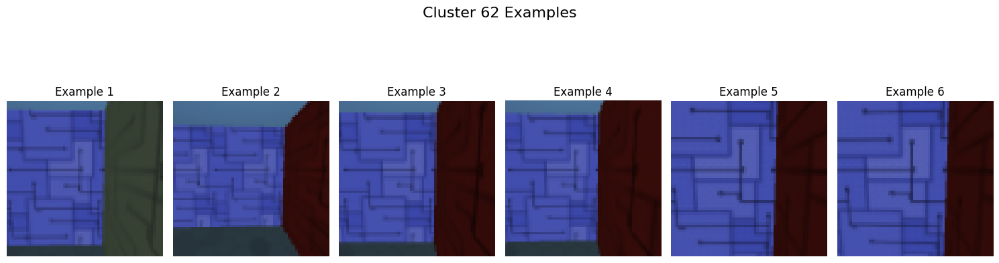

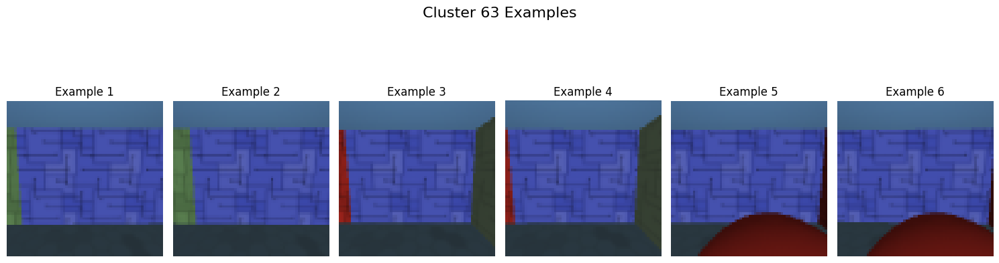

CPU times: user 34min 21s, sys: 1.75 s, total: 34min 23s
Wall time: 1min 11s


In [55]:
%%time
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import pickle

# Load the saved data
data = np.load("../data/small_env_5_5_3actions_100k_low_orient.npz")

# Extract the 'image' key from the data
# Assuming the shape of 'image' is (steps, height, width, channels)
images = data["image"]

# Reshape images for k-means clustering
# Flatten the height, width, and channels for clustering
flattened_images = images.reshape(images.shape[0], -1)

# Number of clusters for k-means
num_clusters = 64

# Perform k-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(flattened_images)


# Save the model to a file
with open('kmeans_model.pkl', 'wb') as file:
    pickle.dump(kmeans, file)

# Cluster labels for each observation
labels = kmeans.labels_

# Reshape each cluster center back into the original image shape
cluster_centers = kmeans.cluster_centers_
cluster_center_images = cluster_centers.reshape((num_clusters, *images.shape[1:]))

# Cast cluster centers to integers in range [0, 255]
cluster_center_images = np.clip(cluster_center_images, 0, 255).astype(np.uint8)

# Display cluster centers
rows = 16
cols = 8
fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
axes = axes.ravel()

for i in range(num_clusters):
    axes[i].imshow(cluster_center_images[i])  # Cluster center image
    axes[i].set_title(f"Cluster {i}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# Display examples for each cluster
for cluster_id in range(num_clusters):
    # Create a new figure for each cluster
    fig, axes = plt.subplots(1, 6, figsize=(15, 5))
    
    # Find up to 6 examples from this cluster
    cluster_examples = np.where(labels == cluster_id)[0][:6]  # Indices of images in this cluster
    
    for i, example_idx in enumerate(cluster_examples):
        example_image = images[example_idx].astype(np.uint8)  # Cast example image to uint8
        axes[i].imshow(example_image)  # Example image
        axes[i].set_title(f"Example {i + 1}")
        axes[i].axis("off")
    
    # Hide unused axes if fewer than 6 examples are found
    for i in range(len(cluster_examples), 6):
        axes[i].axis("off")
    
    fig.suptitle(f"Cluster {cluster_id} Examples", fontsize=16)
    plt.tight_layout()
    plt.show()


## Load kmeans model (faster)

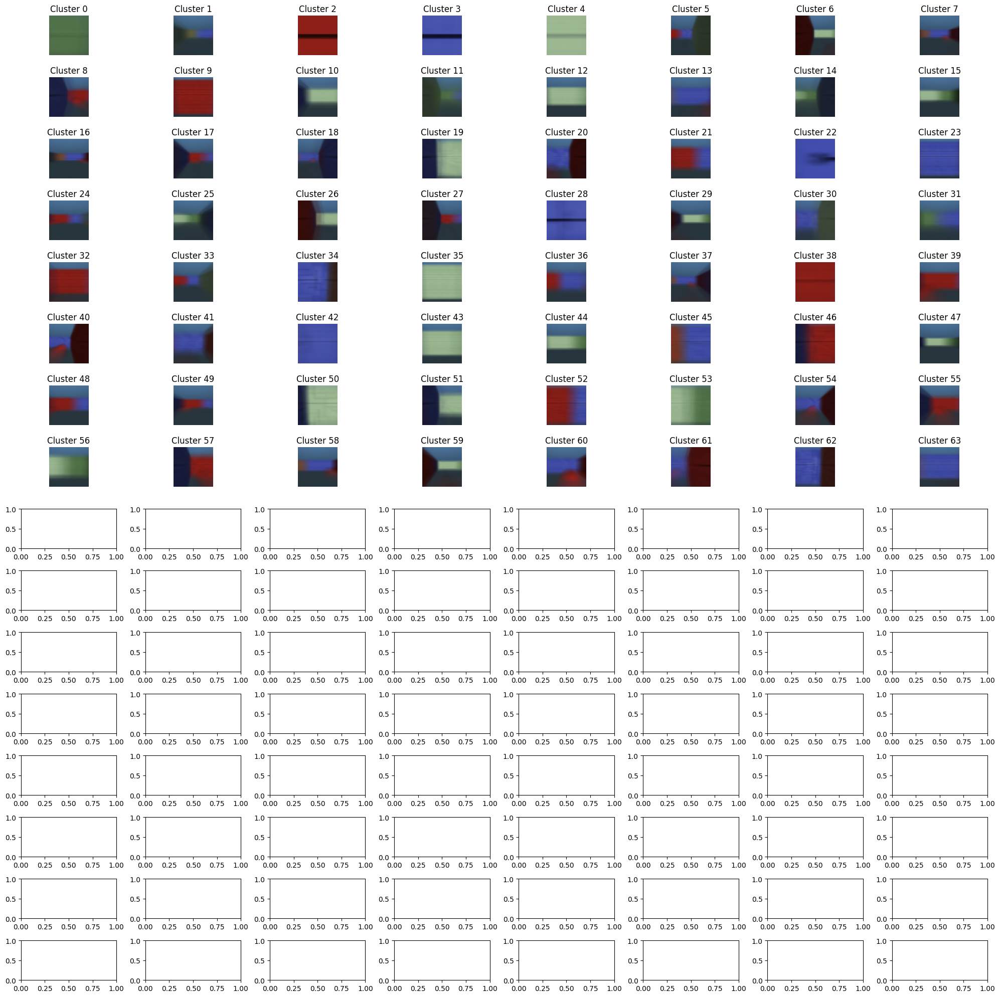

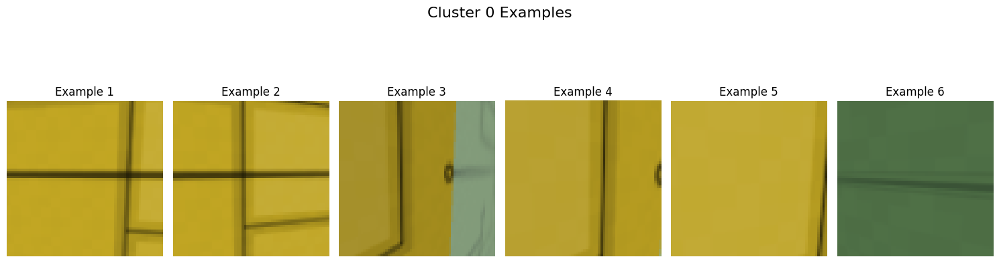

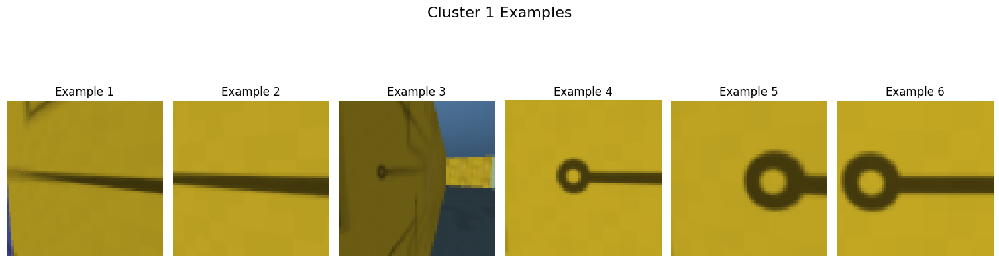

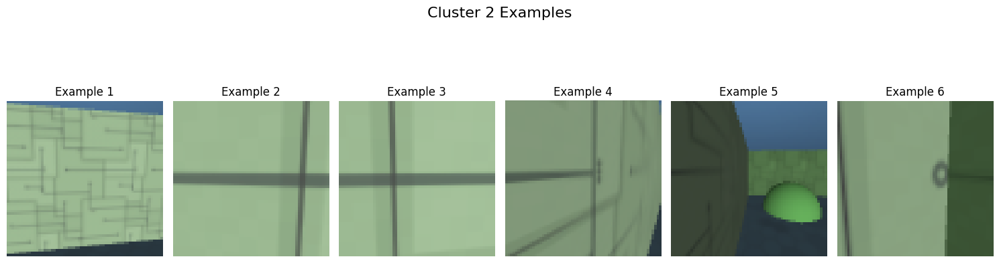

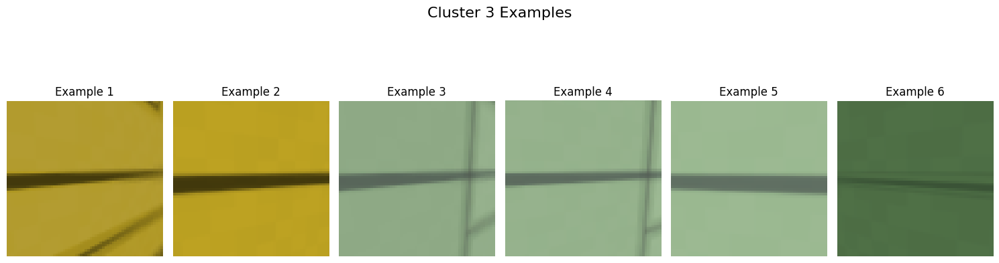

...

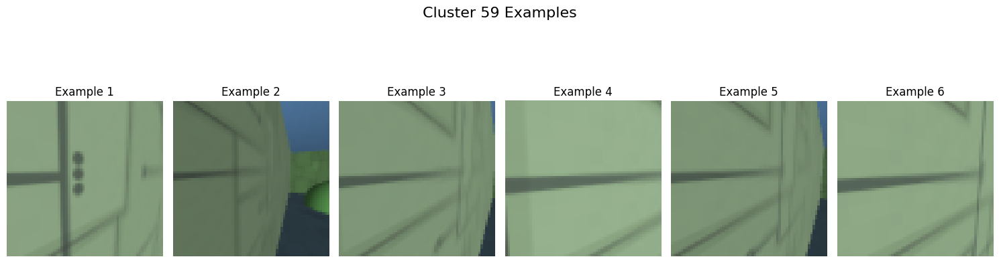

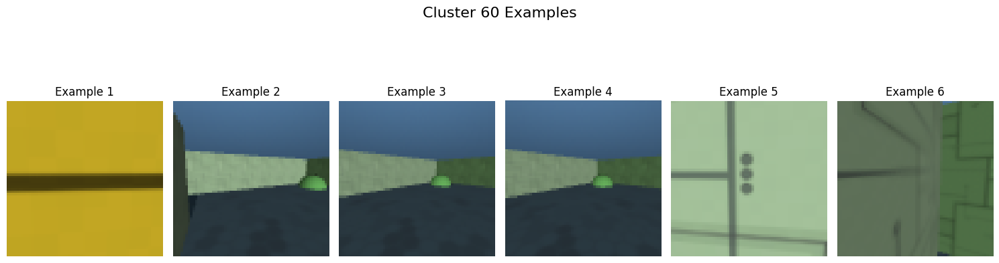

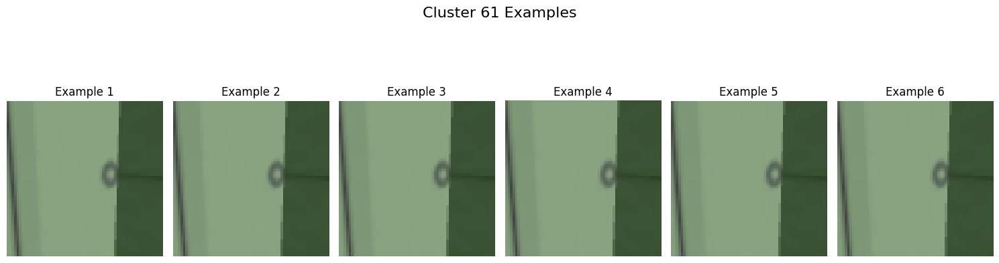

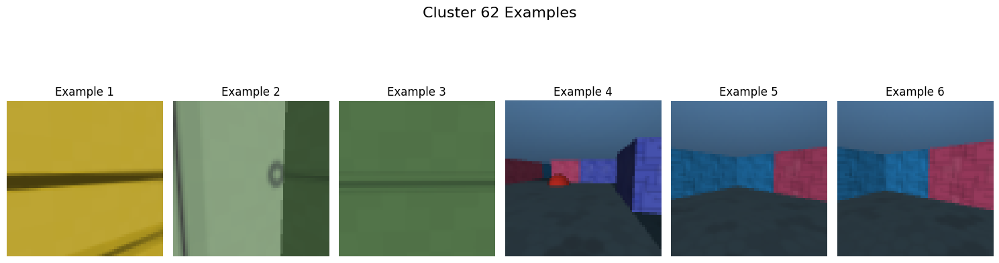

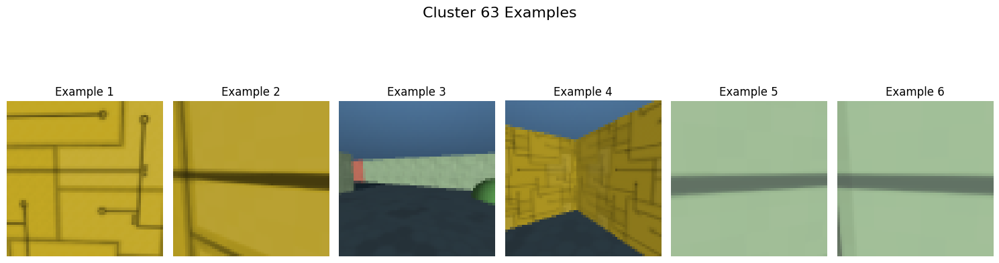

In [57]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import pickle

# Load the saved data
data = np.load("../data/memory_maze_100k.npz")

# Extract the 'image' key from the data
# Assuming the shape of 'image' is (steps, height, width, channels)
images = data["image"]

# Reshape images for k-means clustering
# Flatten the height, width, and channels for clustering
flattened_images = images.reshape(images.shape[0], -1)

# Number of clusters for k-means
num_clusters = 64

# Load the model from the file
with open('kmeans_model.pkl', 'rb') as file:
    kmeans = pickle.load(file)


# Cluster labels for each observation
labels = kmeans.labels_

# Reshape each cluster center back into the original image shape
cluster_centers = kmeans.cluster_centers_
cluster_center_images = cluster_centers.reshape((num_clusters, *images.shape[1:]))

# Cast cluster centers to integers in range [0, 255]
cluster_center_images = np.clip(cluster_center_images, 0, 255).astype(np.uint8)

# Display cluster centers
rows = 16
cols = 8
fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
axes = axes.ravel()

for i in range(num_clusters):
    axes[i].imshow(cluster_center_images[i])  # Cluster center image
    axes[i].set_title(f"Cluster {i}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# Display examples for each cluster
for cluster_id in range(num_clusters):
    # Create a new figure for each cluster
    fig, axes = plt.subplots(1, 6, figsize=(15, 5))
    
    # Find up to 6 examples from this cluster
    cluster_examples = np.where(labels == cluster_id)[0][:6]  # Indices of images in this cluster
    
    for i, example_idx in enumerate(cluster_examples):
        example_image = images[example_idx].astype(np.uint8)  # Cast example image to uint8
        axes[i].imshow(example_image)  # Example image
        axes[i].set_title(f"Example {i + 1}")
        axes[i].axis("off")
    
    # Hide unused axes if fewer than 6 examples are found
    for i in range(len(cluster_examples), 6):
        axes[i].axis("off")
    
    fig.suptitle(f"Cluster {cluster_id} Examples", fontsize=16)
    plt.tight_layout()
    plt.show()


# Get sequence from the single environment

## Run environment 100k steps (slower)

## Load 100k trajectory

In [58]:
import numpy as np
import pickle

# Load the saved environment data
data = np.load("../data/small_env_5_5_3actions_100k_low_orient.npz")

# Extract the 'image' key from the data (assuming it exists)
images = data["image"]

# Reshape images for KMeans clustering
flattened_images = images.reshape(images.shape[0], -1)

# Load the saved KMeans model
with open('kmeans_model.pkl', 'rb') as file:
    kmeans = pickle.load(file)

# Apply the KMeans model to the observations
cluster_indices = kmeans.predict(flattened_images)

# Save the cluster index sequence to a file
np.save("../data/cluster_indices_10k.npy", cluster_indices)

print("Cluster index sequence saved to ../data/cluster_indices_10k.npy")

Cluster index sequence saved to ../data/cluster_indices_10k.npy


In [59]:
cluster_indices

array([36, 31, 36, ..., 44, 21, 44], dtype=int32)

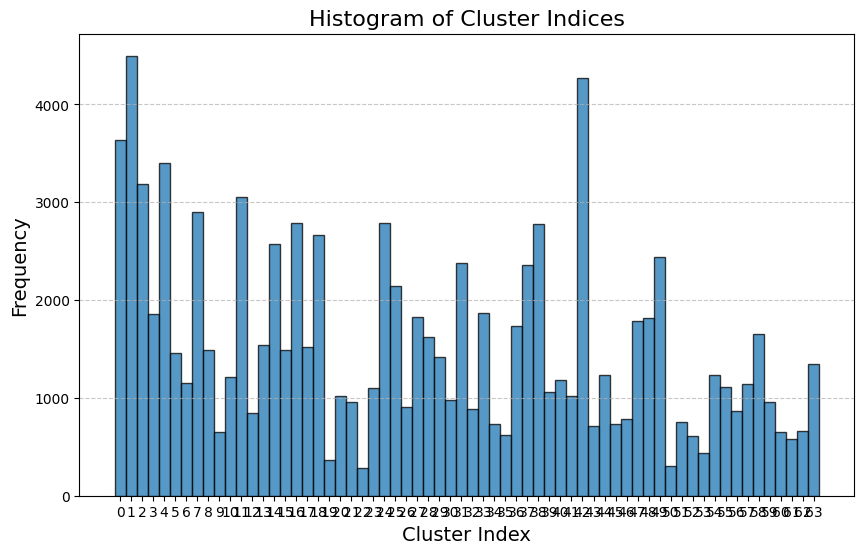

In [60]:
import numpy as np
import matplotlib.pyplot as plt

# Load the cluster indices
cluster_indices = np.load("../data/cluster_indices_10k.npy")

# Plot the histogram of cluster indices
plt.figure(figsize=(10, 6))
plt.hist(cluster_indices, bins=np.arange(cluster_indices.max() + 2) - 0.5, edgecolor='black', alpha=0.75)
plt.title("Histogram of Cluster Indices", fontsize=16)
plt.xlabel("Cluster Index", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.xticks(range(cluster_indices.max() + 1))  # Display all cluster indices
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

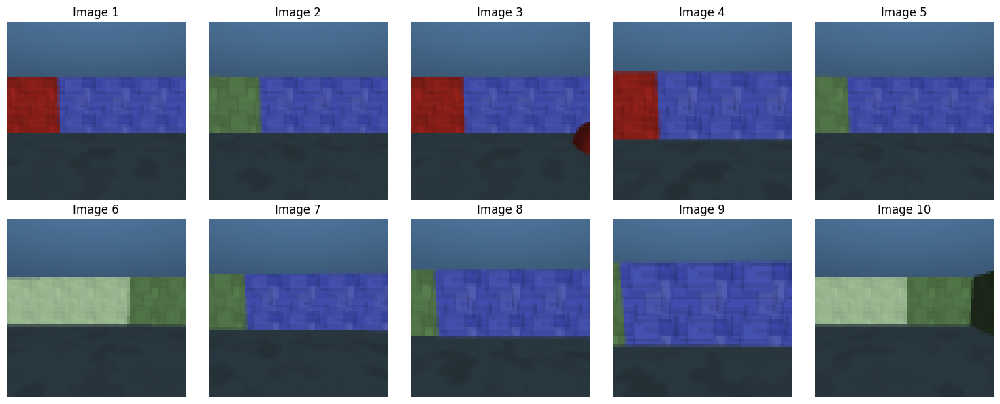

In [61]:
import numpy as np
import matplotlib.pyplot as plt

# Load the saved data
data = np.load("../data/small_env_5_5_3actions_100k_low_orient.npz")

# Extract the 'image' key from the data
images = data["image"]

# Plot the first 10 images
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i + 1)  # Create a grid of 2 rows and 5 columns
    plt.imshow(images[i], cmap='gray')  # Use 'gray' for grayscale images
    plt.title(f"Image {i+1}")
    plt.axis('off')  # Hide axes for better visualization

plt.tight_layout()
plt.show()

In [ ]:
print([k for k in data.keys()])

In [8]:
data['maze_layout'][0]

array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [1, 1, 1, 0, 0],
       [1, 1, 1, 0, 0],
       [1, 1, 1, 0, 0]], dtype=uint8)

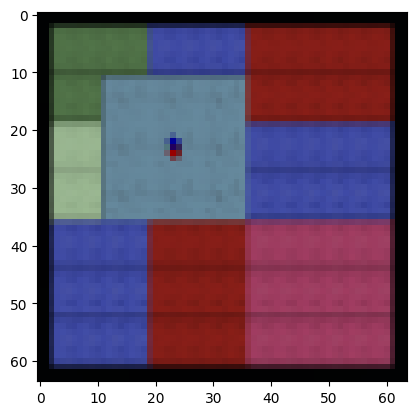

In [9]:
plt.imshow(data['top_image'][0])

In [10]:
data['agent_pos']

array([[1.5       , 3.5       ],
       [1.50013426, 3.50013875],
       [1.50027439, 3.5002784 ],
       ...,
       [1.34997716, 3.06198041],
       [1.34984309, 3.06184316],
       [1.34970795, 3.06170697]])

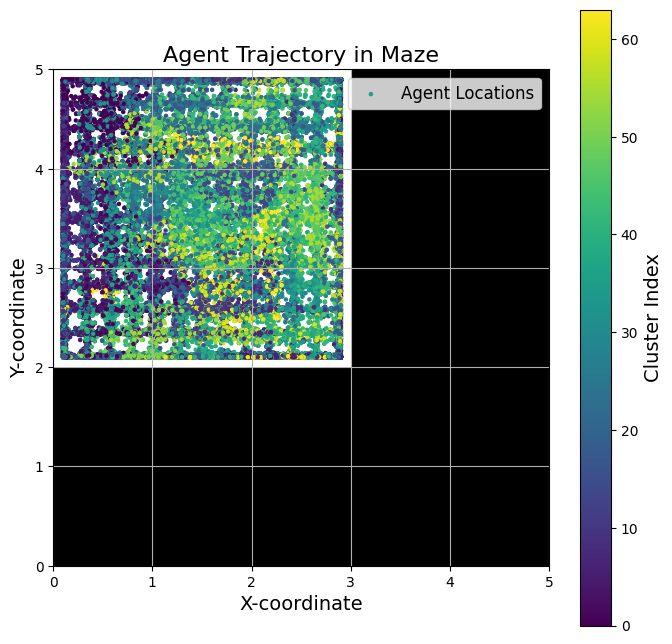

In [62]:
import numpy as np
import matplotlib.pyplot as plt

# Maze layout
maze = data['maze_layout'][0]


# Agent trajectory (sample data)
agent_locations = data['agent_pos']

# Plot the maze
plt.figure(figsize=(8, 8))
plt.imshow(maze, cmap="gray", origin="lower", extent=(0, maze.shape[1], 0, maze.shape[0]))

# Plot the agent's trajectory
# plt.plot(agent_locations[:, 0], agent_locations[:, 1], color="white", linewidth=.5, label="Agent Trajectory")
# Overlay the agent's trajectory with cluster indices as colored circles
sc = plt.scatter(agent_locations[:, 0], agent_locations[:, 1], c=cluster_indices, cmap="viridis", s=5, label="Agent Locations")

# Add a colorbar to show cluster indices
cbar = plt.colorbar(sc)
cbar.set_label("Cluster Index", fontsize=14)

# Add labels and legend
plt.title("Agent Trajectory in Maze", fontsize=16)
plt.xlabel("X-coordinate", fontsize=14)
plt.ylabel("Y-coordinate", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

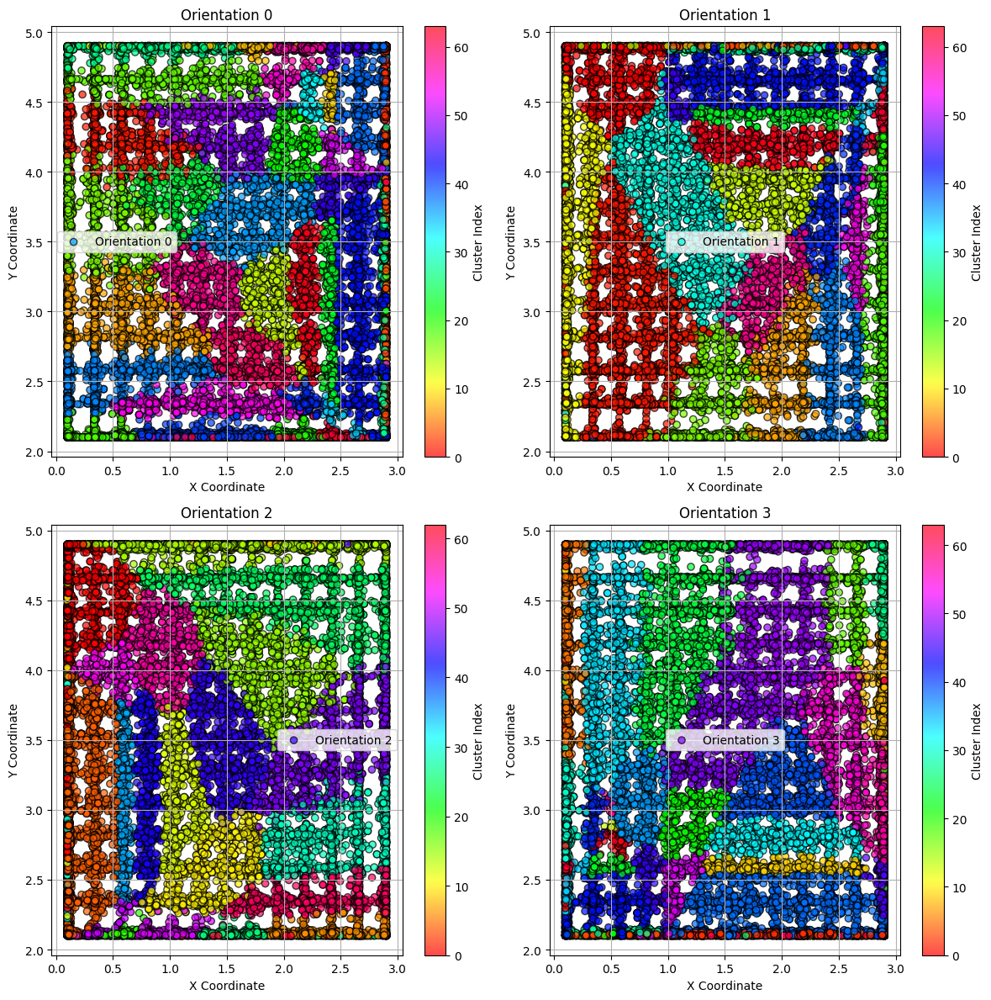

In [63]:
import numpy as np
import matplotlib.pyplot as plt

# Maze layout
maze = data['maze_layout'][0]
orient = data['orientation'] % 4


# Agent trajectory (sample data)
agent_locations = data['agent_pos']


# Create scatter plots for each orientation value
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()
colors = ['red', 'blue', 'green', 'purple']  # Distinct colors for each orientation

for i in range(4):  # Orient values: 0, 1, 2, 3
    ax = axes[i]
    mask = orient == i  # Mask for the current orientation
    scatter = ax.scatter(
        agent_locations[mask, 0], 
        agent_locations[mask, 1], 
        c=cluster_indices[mask], 
        cmap='hsv', 
        label=f'Orientation {i}', 
        alpha=0.7, 
        edgecolor='k'
    )
    ax.set_title(f'Orientation {i}')
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.legend()
    ax.grid(True)

    # Add color bar to indicate cluster indices
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('Cluster Index')

plt.tight_layout()
plt.show()

In [64]:
unique, counts = np.unique(data['orientation'], return_counts=True)
print(unique)
print(counts)
orient = data['orientation'] %4

print(orient == 0)

[-175 -174 -173 -172 -171 -170 -169 -168 -167 -166 -165 -164 -163 -162
 -161 -160 -159 -158 -157 -156 -155 -154 -153 -152 -151 -150 -149 -148
 -147 -146 -145 -144 -143 -142 -141 -140 -139 -138 -137 -136 -135 -134
 -133 -132 -131 -130 -129 -128 -127 -126 -125 -124 -123 -122 -121 -120
 -119 -118 -117 -116 -115 -114 -113 -112 -111 -110 -109 -108 -107 -106
 -105 -104 -103 -102 -101 -100  -99  -98  -97  -96  -95  -94  -93  -92
  -91  -90  -89  -88  -87  -86  -85  -84  -83  -82  -81  -80  -79  -78
  -77  -76  -75  -74  -73  -72  -71  -70  -69  -68  -67  -66  -65  -64
  -63  -62  -61  -60  -59  -58  -57  -56  -55  -54  -53  -52  -51  -50
  -49  -48  -47  -46  -45  -44  -43  -42  -41  -40  -39  -38  -37  -36
  -35  -34  -33  -32  -31  -30  -29  -28  -27  -26  -25  -24  -23  -22
  -21  -20  -19  -18  -17  -16  -15  -14  -13  -12  -11  -10   -9   -8
   -7   -6   -5   -4   -3   -2   -1    0    1    2    3    4    5    6
    7    8    9   10   11   12   13   14   15   16   17   18   19   20
   21 

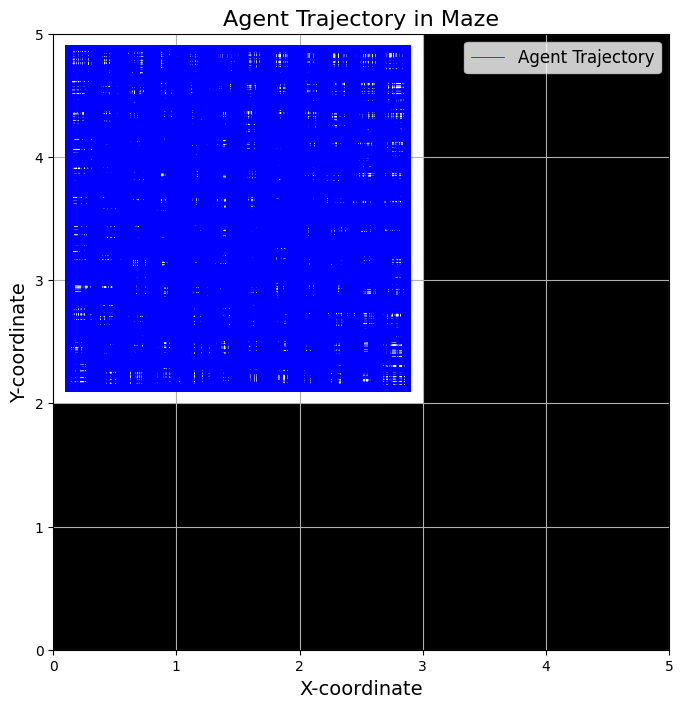

In [65]:
import numpy as np
import matplotlib.pyplot as plt

# Maze layout
maze = data['maze_layout'][0]


# Agent trajectory (sample data)
agent_locations = data['agent_pos']

# Plot the maze
plt.figure(figsize=(8, 8))
plt.imshow(maze, cmap="gray", origin="lower", extent=(0, maze.shape[1], 0, maze.shape[0]))

# Plot the agent's trajectory
plt.plot(agent_locations[:, 0], agent_locations[:, 1], color="blue", linewidth=.5, label="Agent Trajectory")
# Overlay the agent's trajectory with cluster indices as colored circles
# sc = plt.scatter(agent_locations[:, 0], agent_locations[:, 1], c=cluster_indices, cmap="viridis", s=5, label="Agent Locations")

# Add a colorbar to show cluster indices
# cbar = plt.colorbar(sc)
# cbar.set_label("Cluster Index", fontsize=14)

# Add labels and legend
plt.title("Agent Trajectory in Maze", fontsize=16)
plt.xlabel("X-coordinate", fontsize=14)
plt.ylabel("Y-coordinate", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

In [15]:
%gui qt6

# import napari

ERROR:root:
    Could not load requested Qt binding. Please ensure that
    PyQt4 >= 4.7, PyQt5, PyQt6, PySide >= 1.0.3, PySide2, or
    PySide6 is available, and only one is imported per session.

    Currently-imported Qt library:                              None
    PyQt5 available (requires QtCore, QtGui, QtSvg, QtWidgets): False
    PyQt6 available (requires QtCore, QtGui, QtSvg, QtWidgets): False
    PySide2 installed:                                          False
    PySide6 installed:                                          False
    Tried to load:                                              ['pyqt6']
    


In [16]:
# viewer = napari.view_image(data['top_image'])

In [66]:
import sys
from pathlib import Path

# Add the parent directory to sys.path
parent_directory = Path.cwd().parent
sys.path.append(str(parent_directory))

# Import the module


In [67]:
import numpy as np
from chmm_actions import CHMM, forwardE, datagen_structured_obs_room
import matplotlib.pyplot as plt

import igraph
from matplotlib import cm, colors
import os

custom_colors = (
    np.array(
        [
            [214, 214, 214],
            [85, 35, 157],
            [253, 252, 144],
            [114, 245, 144],
            [151, 38, 20],
            [239, 142, 192],
            [214, 134, 48],
            [140, 194, 250],
            [72, 160, 162],
        ]
    )
    / 256
)
if not os.path.exists("figures"):
    os.makedirs("figures")


In [68]:
def plot_graph(
    chmm, x, a, output_file, cmap=cm.Spectral, multiple_episodes=False, vertex_size=10
):
    states = chmm.decode(x, a)[1]

    v = np.unique(states)
    if multiple_episodes:
        T = chmm.C[:, v][:, :, v][:-1, 1:, 1:]
        v = v[1:]
    else:
        T = chmm.C[:, v][:, :, v]
    A = T.sum(0)
    A /= A.sum(1, keepdims=True)

    g = igraph.Graph.Adjacency((A > 0).tolist())
    node_labels = np.arange(x.max() + 1).repeat(n_clones)[v]
    if multiple_episodes:
        node_labels -= 1
    colors = [cmap(nl)[:3] for nl in node_labels / node_labels.max()]
    out = igraph.plot(
        g,
        output_file,
        layout=g.layout("kamada_kawai"),
        vertex_color=colors,
        vertex_label=v,
        vertex_size=vertex_size,
        margin=50,
    )

    return out


def get_mess_fwd(chmm, x, pseudocount=0.0, pseudocount_E=0.0):
    n_clones = chmm.n_clones
    E = np.zeros((n_clones.sum(), len(n_clones)))
    last = 0
    for c in range(len(n_clones)):
        E[last : last + n_clones[c], c] = 1
        last += n_clones[c]
    E += pseudocount_E
    norm = E.sum(1, keepdims=True)
    norm[norm == 0] = 1
    E /= norm
    T = chmm.C + pseudocount
    norm = T.sum(2, keepdims=True)
    norm[norm == 0] = 1
    T /= norm
    T = T.mean(0, keepdims=True)
    log2_lik, mess_fwd = forwardE(
        T.transpose(0, 2, 1), E, chmm.Pi_x, chmm.n_clones, x, x * 0, store_messages=True
    )
    return mess_fwd


def place_field(mess_fwd, rc, clone):
    assert mess_fwd.shape[0] == rc.shape[0] and clone < mess_fwd.shape[1]
    field = np.zeros(rc.max(0) + 1)
    count = np.zeros(rc.max(0) + 1, int)
    for t in range(mess_fwd.shape[0]):
        r, c = rc[t]
        field[r, c] += mess_fwd[t, clone]
        count[r, c] += 1
    count[count == 0] = 1
    return field / count


In [69]:
data['actions'].shape

(100000,)

In [70]:
cluster_indices.max()

np.int32(63)

In [71]:
n_emissions = cluster_indices.max() + 1

# Calculate unique values and their counts
unique_values, counts = np.unique(cluster_indices, return_counts=True)

n_clones = np.ones(n_emissions, dtype=np.int64) * 70

x = cluster_indices.astype(np.int64)
a = data['actions'].astype(np.int64) - 1


In [72]:
unique_values

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63], dtype=int32)

In [73]:
n_clones[unique_values] = counts // 10 

In [74]:
n_clones

array([363, 449, 318, 185, 339, 145, 115, 290, 148,  65, 121, 304,  84,
       154, 257, 149, 279, 152, 266,  36, 101,  95,  28, 110, 278, 214,
        90, 182, 161, 142,  97, 237,  88, 186,  73,  61, 173, 235, 277,
       106, 118, 101, 427,  71, 123,  73,  78, 178, 181, 244,  30,  75,
        61,  43, 123, 111,  86, 113, 164,  95,  64,  58,  66, 134])

In [75]:
chmm = CHMM(n_clones=n_clones, pseudocount=1e-5, x=x, a=a, seed=42)

Average number of clones: 155.78125


In [76]:
cluster_indices.dtype

dtype('int32')

In [ ]:
progression = chmm.learn_em_T(x, a, n_iter=10000, term_early=True)  # Training

 19%|████████████████▉                                                                         | 1885/10000 [14:39:49<65:42:59, 29.15s/it, train_bps=0.161]

In [ ]:
chmm.pseudocount=0.0
chmm.learn_viterbi_T(x, a, n_iter=1000)

In [ ]:
with open("../data/chmm_100k.pkl", "wb") as f:
    pickle.dump(chmm, f)

In [ ]:
def plot_graph_initial_position(
    chmm, x, a, output_file, cmap=cm.Spectral, multiple_episodes=False, vertex_size=10, ground_truth_positions=None
):
    states = chmm.decode(x, a)[1]

    v = np.unique(states)
    print(f'number of states {len(v)}')
    if multiple_episodes:
        T = chmm.C[:, v][:, :, v][:-1, 1:, 1:]
        v = v[1:]
    else:
        T = chmm.C[:, v][:, :, v]
    A = T.sum(0)
    A /= A.sum(1, keepdims=True)
    


    # Calculate the ground truth positions        
    # Initialize layout
    if ground_truth_positions is not None:
        # Ensure positions match the number of vertices
        assert len(ground_truth_positions) == len(states), "Mismatch between vertices and ground truth positions"
        # Initialize a dictionary to store the sum of positions and count for each state
        state_positions = {state: {'sum': np.zeros(2), 'count': 0} for state in states}

        # Iterate through the states and accumulate the positions
        for state, position in zip(states, ground_truth_positions):
            state_positions[state]['sum'] += position
            state_positions[state]['count'] += 1

        # Calculate the average position for each state
        average_positions = {state: pos['sum'] / pos['count'] if pos['count'] > 0 else np.zeros(2)
                            for state, pos in state_positions.items()}


        g = igraph.Graph.Adjacency((A > 0).tolist())
        node_labels = np.arange(x.max() + 1).repeat(n_clones)[v]
        
        if multiple_episodes:
            node_labels -= 1
        colors = [cmap(nl)[:3] for nl in node_labels / node_labels.max()]
        layout = [average_positions[state] for state in v]
        g.vs["x"] = [pos[0] for pos in layout]
        g.vs["y"] = [pos[1] for pos in layout]
        # Update layout using Kamada-Kawai starting from ground truth
        # Convert vertex attributes into initial layout coordinates
        layout = g.layout_kamada_kawai()
    else:
        # Default to Kamada-Kawai layout
        layout = g.layout("kamada_kawai")

    # Plot the graph
    out = igraph.plot(
        g,
        output_file,
        layout=layout,
        vertex_color=colors,
        vertex_label=v,
        vertex_size=vertex_size,
        margin=50,
    )

    return out
        

In [ ]:
graph = plot_graph_initial_position(
    chmm, x, a, output_file="figures/memory_maze_graph.pdf", cmap=cm.Reds, ground_truth_positions=data['agent_pos']
)
graph

In [34]:
n_clones = np.ones(n_emissions, dtype=np.int64) 

total = counts.sum() 
n_clones[unique_values] = (counts / total * 128 * 70).astype(np.int64) + 5

In [35]:
n_clones

array([125,  73,  13, 107, 131,  64,  82, 221,  80,  66,  71,  98, 119,
       132,  35, 108,  91,  51,  67,  44,  38, 121,  79,  70,  22, 108,
       197, 184, 141, 122,  50, 133,  54, 172,  77,  49,  83,  48,  76,
        78,  35, 122, 120,  95,  30,  46,  42, 122,  26,  51,  92,  35,
       113,  78,  65,  42, 101,  29,  55, 115,  32,  32,  63,  99,  46,
        42,  71,  63,  80,  39,  43,  65,  44,  46, 273,  30,  94,  60,
        99,  82,  84,  30,  39,  82, 103,  46, 106,  84,  19,  56,  65,
        41,  42, 133,  72,  96,  35,  90,  75,  32,  59,  53,  45,  25,
        67, 151,  39, 107,  62, 117,  88, 111,  30,  78,  33,  24,  52,
        71,  30,  24, 100,  19,  44, 144,  48,  48,  24,  21])

In [36]:
n_emissions = cluster_indices.max() + 1


x = cluster_indices.astype(np.int64)
a = data['actions'].astype(np.int64) - 1 

chmm = CHMM(n_clones=n_clones, pseudocount=2e-3, x=x, a=a, seed=42)

progression = chmm.learn_em_T(x, a, n_iter=10000, term_early=True)  # Training


Average number of clones: 74.5390625


  1%|▎                                 | 109/10000 [01:32<2:20:35,  1.17it/s, train_bps=2.3]


In [37]:
chmm.pseudocount=0.0
chmm.learn_viterbi_T(x, a, n_iter=1000)

  0%|                                      | 3/1000 [00:01<07:50,  2.12it/s, train_bps=1.49]


[np.float32(2.3130126),
 np.float32(1.4885366),
 np.float32(1.4882411),
 np.float32(1.4882411)]

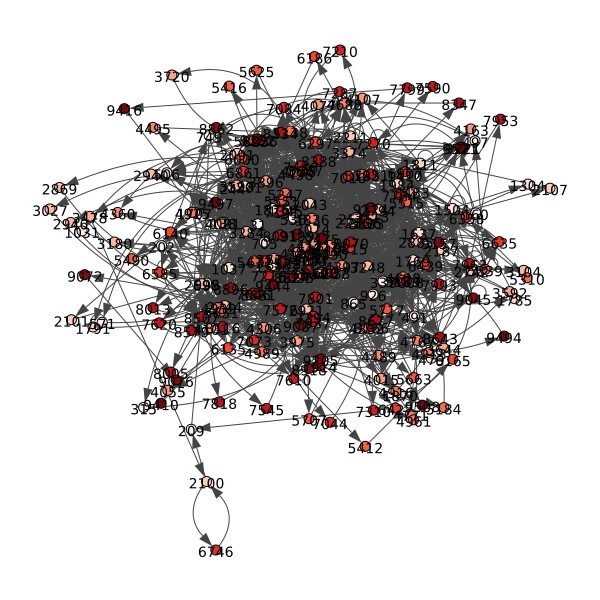

In [38]:
graph = plot_graph(
    chmm, x, a, output_file="figures/memory_maze_graph_clone_variable.pdf", cmap=cm.Reds
)
graph

In [ ]:
a